In [ ]:
#================================
# CONFIGURE
#================================


import os 
import subprocess 
import nibabel as nib 
import seaborn as sns 
import numpy as np 
import pandas as pd 
import tempfile 
import glob
from nilearn import image as nlimage
import re
from nilearn.glm import threshold_stats_img
from nilearn.plotting import plot_design_matrix, plot_glass_brain
import matplotlib.pyplot as plt
from nilearn.glm.second_level import SecondLevelModel
from joblib import Parallel, delayed
import warnings


Asterix_c = [16, 17, 20, 21, 25, 26, 29, 30, 32]#, 33, 34, 35, 36, 39, 40, 44]  # ses-01
Asterix_w = [15, 18, 19, 22, 23, 24, 27, 28, 31] #, 37, 38, 41, 42, 43, 45]      # ses-13

CONDITIONS = {
    "Asterix_c": (Asterix_c, "01"),
    "Asterix_w": (Asterix_w, "13")
}

# Direction SET
vp_ABC=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 39, 40, 41, 43]
vp_BCA=[18, 19, 20, 21, 23, 24, 22, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 42]

TEMPLATE = "PANORAMIX"
TEMPLATE_PATH = f"/home/malberti/Unix_Folders/Asterix_Obelix_Population_Template/Panoramix_Template_Tmean.nii"
TEMPLATE_MASK = f"/home/malberti/Unix_Folders/Asterix_Obelix_Population_Template/Panoramix_Template_Tmean_mask.nii"

KERNEL = []
SMOOTHING = "6mm"
l2fwhm = [1.69865806, 2.54798709]   # KERNEL 4 mni space smoothing in mm l2fwhm=(4 6)

PRJ_path =  r"/home/malberti/wks14/temp/FF_DWI_Drift"
SHELLs = [0, 1000]


# Gradient Analysis
---------------------------

In [ ]:

for condition, (sub_ids, ses) in CONDITIONS.items():
    for sid in sub_ids:
        pid = f"sub-{sid:02d}"
        subjid = f"{pid}_ses-{ses}"
        derivatives = os.path.join(PRJ_path, "derivatives", pid, f"ses-{ses}", "dwi")

        DWIs = os.path.join(derivatives, "eddy", f"{subjid}_eddy_corrected.nii")
        BVECs = os.path.join(derivatives, "eddy", f"{subjid}_eddy_corrected.eddy_rotated_bvecs")
        BVALs = os.path.join(derivatives, "prep", f"{subjid}_dir-PA-AP_part-mag_dwi.bval")
        unwarped_reference = os.path.join(derivatives, "eddy", f"{subjid}_unwarped.nii")

        # dMRI --> MNI space coregistration + smoothing
        coreg = os.path.join(derivatives, "index2TEMPLATE")  # dwi --> T1w matrix
        os.makedirs(coreg, exist_ok=True)  # antsRegistrationSyN.sh needs this to exist first

        out_prefix = os.path.join(coreg, f"{subjid}_eddy_corrected_2PANORAMIX_")
        t1w2MNI = os.path.join(coreg, f"{subjid}_eddy_corrected_2PANORAMIX_1Warp.nii.gz")  # non-linear warp
        t1w2MNI_lin = os.path.join(coreg, f"{subjid}_eddy_corrected_2PANORAMIX_0GenericAffine.mat")

        # Compute the dMRI --> template transform once per subject (reused for both shells below)
        subprocess.run([
            "antsRegistrationSyN.sh",
            "-d", "3",
            "-f", "/home/malberti/Unix_Folders/Asterix_Obelix_Population_Template/Panoramix_Template_Tmean.nii",
            "-m", f"{unwarped_reference}",
            "-o", f"{out_prefix}",
        ], check=True)

        for SHELL in SHELLs:
            out_dir = os.path.join(derivatives, "Gradient_Analysis")
            os.makedirs(out_dir, exist_ok=True)

            out_DWI = os.path.join(out_dir, f"{subjid}_eddy_corrected_b-{SHELL}.nii.gz")

            if SHELL > 0:
                subprocess.run(f"dwiextract {DWIs} -shell {SHELL} {out_DWI} -no_bzero -fslgrad {BVECs} {BVALs} -force -debug", shell=True, check=True)
            elif SHELL == 0:
                subprocess.run(f"dwiextract {DWIs} {out_DWI} -bzero -fslgrad {BVECs} {BVALs} -force -debug", shell=True, check=True)

            print(f"\n Subj: {pid} \n Ses: {ses} \n SHELL: {SHELL} Extracted")

            with tempfile.TemporaryDirectory() as tmp:
                subprocess.run(["fslsplit", out_DWI, os.path.join(tmp, "vol")], check=True)

                volumes = sorted(glob.glob(os.path.join(tmp, "vol*.nii")))
                print(f"Coreg. N = {len(volumes)}")

                for count, file in enumerate(volumes, start=1):
                    cmd = [
                        "antsApplyTransforms", "-d", "3",
                        "-i", file,
                        "-r", "/home/malberti/Unix_Folders/Asterix_Obelix_Population_Template/Panoramix_Template_Tmean.nii",
                        "-o", file,
                        "-t", f"{t1w2MNI}",
                        "-t", f"{t1w2MNI_lin}",
                        "--interpolation", "Linear",
                    ]
                    print(cmd)
                    subprocess.run(cmd, check=True)

                    tmp1 = os.path.join(tmp, "tt1.nii.gz")
                    tmp2 = os.path.join(tmp, "tt2.nii.gz")

                    subprocess.run(f"fslmaths {file} -mas {TEMPLATE_MASK} -s {l2fwhm[1]} -mas {TEMPLATE_MASK} {tmp1}", shell=True)
                    subprocess.run(f"fslmaths {TEMPLATE_MASK} -s {l2fwhm[1]} -mas {TEMPLATE_MASK} {tmp2}", shell=True)
                    subprocess.run(f"fslmaths {tmp1} -div {tmp2} {file}", shell=True)

                    print(f"Smoothing.... \n {count}/{len(volumes)}")

                smoothed_volumes = " ".join(sorted(glob.glob(os.path.join(tmp, "vol*"))))

                out_DWI_mni = os.path.join(out_dir, f"{subjid}_eddy_corrected_b-{SHELL}_2PANORAMIX6mm.nii.gz")
                subprocess.run(f"mrcat {smoothed_volumes} {out_DWI_mni} -force", shell=True, check=True)

                print(f"\n Completed: {out_DWI_mni}")

### Prepare a GLM 
---------------------

In [ ]:
from nilearn import image as nimg
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm import threshold_stats_img
from nilearn.plotting import plot_design_matrix, plot_stat_map, show
from nilearn import image as nimg

TEMPLATE_PATH = "/home/malberti/Unix_Folders/Asterix_Obelix_Population_Template/Panoramix_Template_Tmean.nii"

n_c = len(Asterix_c)
n_w = len(Asterix_w)

# Unpaired (two-sample) design: one indicator column per group, no subject-effect regressors
# (subject_effect / np.eye rows are for PAIRED designs, where the same subjects appear in
#  both conditions — that doesn't apply here, since Asterix_c and Asterix_w are different subjects)
unpaired_design_matrix = pd.DataFrame({
    "Asterix_c": [1] * n_c + [0] * n_w,
    "Asterix_w": [0] * n_c + [1] * n_w,
})

fig, ax = plt.subplots(1, 1, figsize=(8, 6), constrained_layout=True)
plot_design_matrix(unpaired_design_matrix, rescale=False, axes=ax)
ax.set_title("Unpaired design", fontsize=12)

for SHELL in SHELLs:
    for condition, (sub_ids, ses) in CONDITIONS.items():
        condition_NIFTI = []
        for sid in sub_ids:
            pid = f"sub-{sid:02d}"
            subjid = f"{pid}_ses-{ses}"
            derivatives = os.path.join(PRJ_path, "derivatives", pid, f"ses-{ses}", "dwi")
            out_dir = os.path.join(derivatives, "Gradient_Analysis")

            DWI_mni = os.path.join(out_dir, f"{subjid}_eddy_corrected_b-{SHELL}_2PANORAMIX6mm.nii.gz")
            mean_path = os.path.join(out_dir, f"{subjid}_eddy_corrected_b-{SHELL}_2PANORAMIX6mm_mean.nii")

            subprocess.run(f"fslmaths {DWI_mni} -Tmean {mean_path}", shell=True, check=True)
            condition_NIFTI.append(mean_path)

        group_out_dir = os.path.join(PRJ_path, "Gradient_Analysis")
        os.makedirs(group_out_dir, exist_ok=True)

        merged_inputs = " ".join(condition_NIFTI)
        out_DWI_mni = os.path.join(group_out_dir, f"{condition}_eddy_corrected_b-{SHELL}_2PANORAMIX6mm.nii.gz")
        subprocess.run(f"mrcat {merged_inputs} {out_DWI_mni} -force", shell=True, check=True)

    # Now run t-test (after both conditions for this SHELL have been built)
    group_out_dir = os.path.join(PRJ_path, "Gradient_Analysis")

    condition01 = os.path.join(group_out_dir, f"Asterix_c_eddy_corrected_b-{SHELL}_2PANORAMIX6mm.nii.gz")
    condition02 = os.path.join(group_out_dir, f"Asterix_w_eddy_corrected_b-{SHELL}_2PANORAMIX6mm.nii.gz")

    # Split each 4D nifti (one mean volume per subject) into a list of 3D images,
    # ordered to match the design matrix: Asterix_c block first, Asterix_w block second
    condition01_imgs = list(nimg.iter_img(condition01))
    condition02_imgs = list(nimg.iter_img(condition02))
    imgs = condition01_imgs + condition02_imgs  # length == n_c + n_w, matches design matrix row order

    if len(imgs) != unpaired_design_matrix.shape[0]:
        print(f"\n Skipping SHELL {SHELL}: got {len(imgs)} images, expected {unpaired_design_matrix.shape[0]}")
        continue

    # ── GLM ───────────────────────────────────────────────────
    model = SecondLevelModel(n_jobs=2, verbose=0)
    model.fit(imgs, design_matrix=unpaired_design_matrix)

    z_map = model.compute_contrast("Asterix_c - Asterix_w", output_type="z_score")

    thresholded_map1, threshold1 = threshold_stats_img(
        z_map,
        alpha=0.001,
        # height_control="fdr",
        cluster_threshold=10,
        two_sided=True,
    )

    display = plot_stat_map(
        z_map,               # full z-score map (not per-cluster)
        bg_img=TEMPLATE_PATH,            # plot on the template image
        #threshold=2.5,                   # p < .001 uncorrected
        vmax=4,
        symmetric_cbar=True,
        cmap="bwr",
        colorbar=True,
        display_mode="ortho",
        black_bg=False,
        title=f"Asterix_c vs Asterix_w  |  SHELL-{SHELL}",
    )
    # display.add_contours(HPC_parcel, levels=[0.5], colors="black", linewidths=0.4)
    show()

    print(f"\n SHELL {SHELL} unpaired t-test completed")

## Compute GLM between conditions across shells WITHOUT AVERAGE
-------------------------------------------------------------------

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm import threshold_stats_img
from nilearn.plotting import plot_design_matrix, plot_stat_map, show

TEMPLATE_PATH = "/home/malberti/Unix_Folders/Asterix_Obelix_Population_Template/Panoramix_Template_Tmean.nii"


def load_4d_as_image_list(path):
    """Load a 4D nifti once and split it into a list of Nifti1Image volumes via numpy slicing —
    fast, no fslsplit subprocess calls, no nimg.iter_img validation overhead."""
    img = nib.load(path)
    data = img.get_fdata(dtype=np.float32)
    affine = img.affine
    header = img.header
    return [nib.Nifti1Image(data[..., i], affine, header) for i in range(data.shape[-1])]


for SHELL in SHELLs:
    group_out_dir = os.path.join(PRJ_path, "Gradient_Analysis")

    condition01 = os.path.join(group_out_dir, f"Asterix_c_eddy_corrected_b-{SHELL}_2PANORAMIX6mm.nii.gz")
    condition02 = os.path.join(group_out_dir, f"Asterix_w_eddy_corrected_b-{SHELL}_2PANORAMIX6mm.nii.gz")

    condition01_imgs = load_4d_as_image_list(condition01)
    condition02_imgs = load_4d_as_image_list(condition02)
    condition_NIFTI = condition01_imgs + condition02_imgs  # Asterix_c volumes first, then Asterix_w

    n_c = len(condition01_imgs)
    n_w = len(condition02_imgs)

    # Unpaired (two-sample) design, sized to actual volume counts — not subject counts,
    # since each subject may contribute multiple volumes here
    unpaired_design_matrix = pd.DataFrame({
        "Asterix_c": [1] * n_c + [0] * n_w,
        "Asterix_w": [0] * n_c + [1] * n_w,
    })

    fig, ax = plt.subplots(1, 1, figsize=(8, 6), constrained_layout=True)
    plot_design_matrix(unpaired_design_matrix, rescale=False, axes=ax)
    ax.set_title(f"Unpaired design — SHELL {SHELL}", fontsize=12)

    if len(condition_NIFTI) != unpaired_design_matrix.shape[0]:
        print(f"\n Skipping SHELL {SHELL}: got {len(condition_NIFTI)} images, expected {unpaired_design_matrix.shape[0]}")
        continue

    # ── GLM ───────────────────────────────────────────────────
    model = SecondLevelModel(n_jobs=2, verbose=0)
    model.fit(condition_NIFTI, design_matrix=unpaired_design_matrix)

    z_map = model.compute_contrast("Asterix_c - Asterix_w", output_type="z_score")

    thresholded_map1, threshold1 = threshold_stats_img(
        z_map,
        alpha=0.001,
        cluster_threshold=10,
        two_sided=True,
    )

    display = plot_stat_map(
        thresholded_map1,
        bg_img=TEMPLATE_PATH,
        vmax=4,
        symmetric_cbar=True,
        cmap="bwr",
        colorbar=True,
        display_mode="ortho",
        black_bg=False,
        title=f"Asterix_c vs Asterix_w  |  SHELL-{SHELL}",
    )
    show()

    print(f"\n SHELL {SHELL} unpaired t-test completed")

In [ ]:
thresholded_map1, threshold1 = threshold_stats_img(
    z_map,
    alpha=0.001,
    cluster_threshold=10,
    two_sided=True,
    height_control="fdr"
)

display = plot_stat_map(
    thresholded_map1,
    threshold = 3.29,
    bg_img=TEMPLATE_PATH,
    vmax=4,
    symmetric_cbar=True,
    cmap="bwr",
    colorbar=True,
    display_mode="ortho",
    black_bg=False,
    title=f"Asterix_c vs Asterix_w  |  SHELL-{SHELL}",
)
show()


# Compute T-test across volumes + matrix and potato plot

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm import threshold_stats_img
from nilearn.plotting import plot_design_matrix, plot_stat_map, show
from nilearn import image as nimg

TEMPLATE_PATH = "/home/malberti/Unix_Folders/Asterix_Obelix_Population_Template/Panoramix_Template_Tmean.nii"

n_c = len(Asterix_c)
n_w = len(Asterix_w)

# Unpaired (two-sample) design: one indicator column per group, no subject-effect regressors
# (subject_effect / np.eye rows are for PAIRED designs, where the same subjects appear in
#  both conditions — that doesn't apply here, since Asterix_c and Asterix_w are different subjects)
unpaired_design_matrix = pd.DataFrame({
    "Asterix_c": [1] * n_c + [0] * n_w,
    "Asterix_w": [0] * n_c + [1] * n_w,
})

fig, ax = plt.subplots(1, 1, figsize=(8, 6), constrained_layout=True)
plot_design_matrix(unpaired_design_matrix, rescale=False, axes=ax)
ax.set_title("Unpaired design", fontsize=12)

for condition, (sub_ids, ses) in CONDITIONS.items():
    condition_NIFTI = []
    with tempfile.TemporaryDirectory() as tmp:  # holds every subject's split volumes together
            subjids = []  # track subject order so we know what "vol0000 across subjects" means later

            for sid in sub_ids:
                pid = f"sub-{sid:02d}"
                subjid = f"{pid}_ses-{ses}"
                derivatives = os.path.join(PRJ_path, "derivatives", pid, f"ses-{ses}", "dwi")
                out_dir = os.path.join(derivatives, "Gradient_Analysis")
                print(f"Splitting: {subjid}")

                DWIs = os.path.join(derivatives, "eddy", f"{subjid}_eddy_corrected.nii")
                BVECs = os.path.join(derivatives, "eddy", f"{subjid}_eddy_corrected.eddy_rotated_bvecs")
                BVALs = os.path.join(derivatives, "prep", f"{subjid}_dir-PA-AP_part-mag_dwi.bval")
                N_volumes = nib.load(DWIs).get_fdata().shape[3]

                # dMRI --> MNI space coregistration + smoothing
                coreg = os.path.join(derivatives, "index2TEMPLATE")  # dwi --> T1w matrix
                os.makedirs(coreg, exist_ok=True)  # antsRegistrationSyN.sh needs this to exist first

                out_prefix = os.path.join(coreg, f"{subjid}_eddy_corrected_2PANORAMIX_")
                t1w2MNI = os.path.join(coreg, f"{subjid}_eddy_corrected_2PANORAMIX_1Warp.nii.gz")  # non-linear warp
                t1w2MNI_lin = os.path.join(coreg, f"{subjid}_eddy_corrected_2PANORAMIX_0GenericAffine.mat")

                volumes_TAG = os.path.join(tmp, f"{subjid}_eddy_corrected_2PANORAMIX_2MNI6mm-vol")
                subprocess.run(["fslsplit", DWIs, volumes_TAG], check=True)

                volumes = sorted(glob.glob(os.path.join(tmp, f"{subjid}*vol*.nii")))
                print(f"Coreg. N = {len(volumes)}")

                for count, file in enumerate(volumes, start=1):
                    cmd = [
                        "antsApplyTransforms", "-d", "3",
                        "-i", file,
                        "-r", "/home/malberti/Unix_Folders/Asterix_Obelix_Population_Template/Panoramix_Template_Tmean.nii",
                        "-o", file,
                        "-t", f"{t1w2MNI}",
                        "-t", f"{t1w2MNI_lin}",
                        "--interpolation", "Linear",
                    ] 

                    subprocess.run(cmd, check=True)

                    tmp1 = os.path.join(tmp, "tt1.nii.gz")
                    tmp2 = os.path.join(tmp, "tt2.nii.gz")

                    subprocess.run(f"fslmaths {file} -mas {TEMPLATE_MASK} -s {l2fwhm[1]} -mas {TEMPLATE_MASK} {tmp1}", shell=True)
                    subprocess.run(f"fslmaths {TEMPLATE_MASK} -s {l2fwhm[1]} -mas {TEMPLATE_MASK} {tmp2}", shell=True)
                    subprocess.run(f"fslmaths {tmp1} -div {tmp2} {file}", shell=True)

                    print(f"Smoothing.... \n {count}/{len(volumes)}")


            # Now that every subject has been split into tmp, group by volume index across subjects
            group_out_dir = os.path.join(PRJ_path, "Gradient_Analysis")
            os.makedirs(group_out_dir, exist_ok=True)

            for volume in range(N_volumes):  # assumes all subjects have the same N_volumes — see note below
                matching_files = sorted(glob.glob(os.path.join(tmp, f"*_eddy_corrected_2PANORAMIX_2MNI6mm-vol{volume:04d}.nii*")))
                merged_across_subjects = " ".join(matching_files)

                out_DWI_mni = os.path.join(group_out_dir, f"{ses}_signal-drift_ABC_corr_2MNI6mm-vol{volume:04d}_group.nii.gz")
                subprocess.run(f"mrcat {merged_across_subjects} {out_DWI_mni} -force", shell=True, check=True)

                print(f"\n Session: {ses} \n Volume index: {volume:04d} \n Merged {len(matching_files)} subjects")

/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 60
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 61
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 62
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 63
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 64
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 65
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 66
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 67
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 68
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 69
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 70
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


Processing volume 71
  n_c=9, n_w=9


/tmp/ipykernel_3373032/2346785777.py:43: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  display = plot_stat_map(


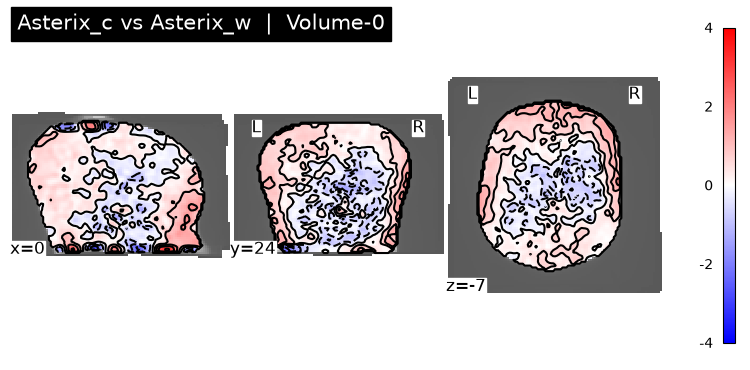

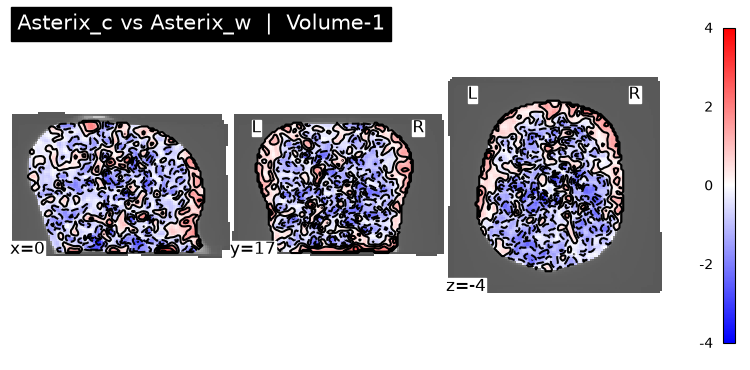

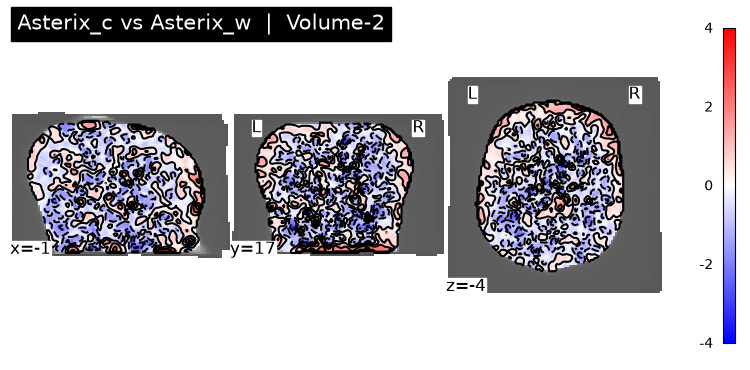

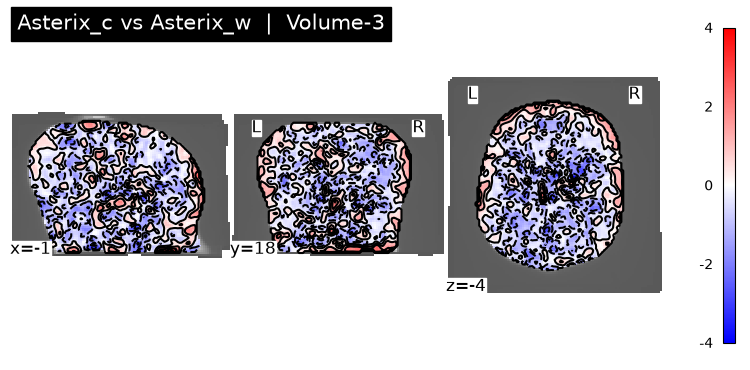

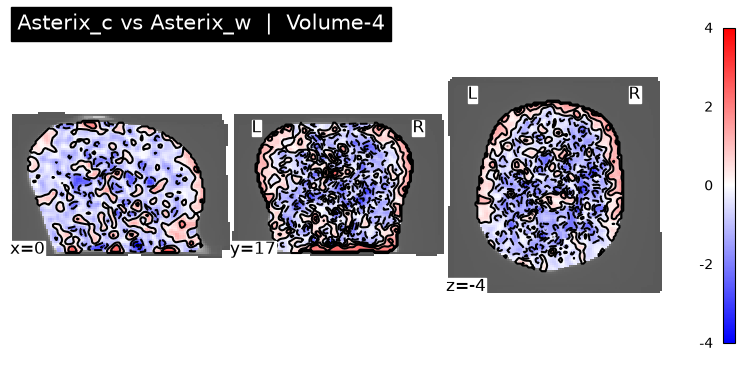

...

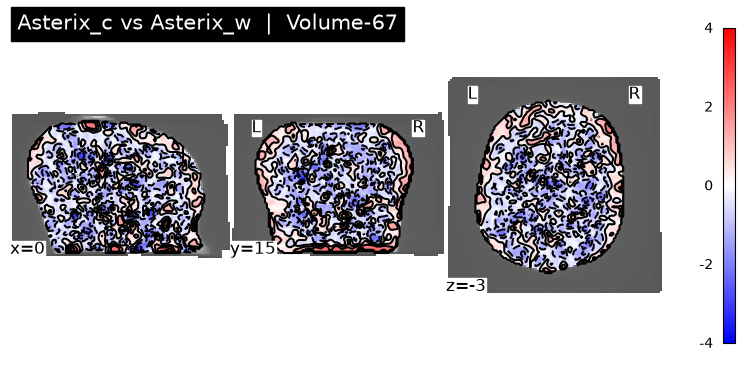

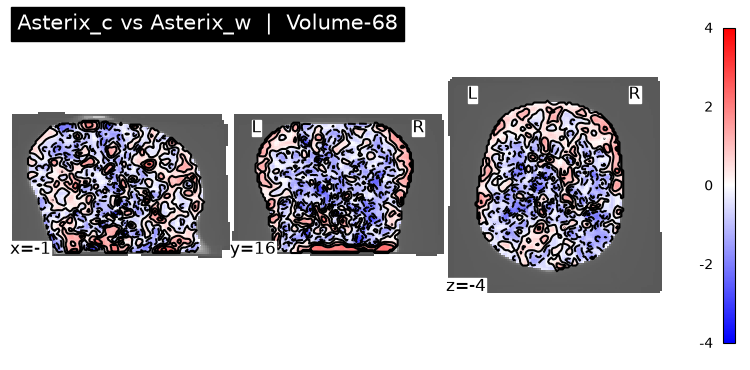

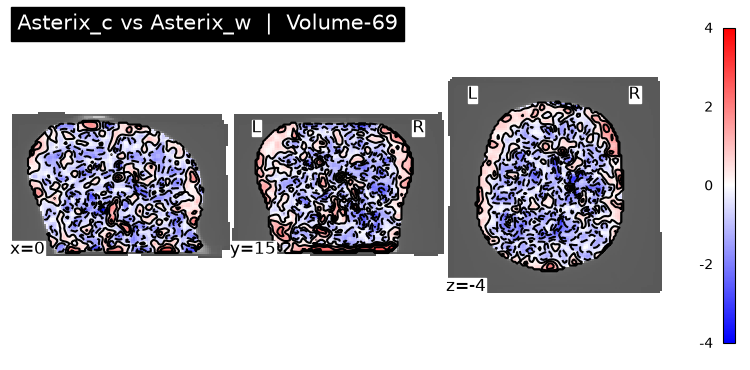

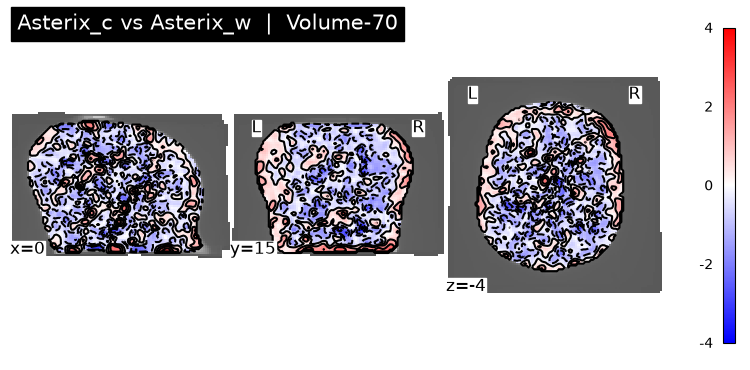

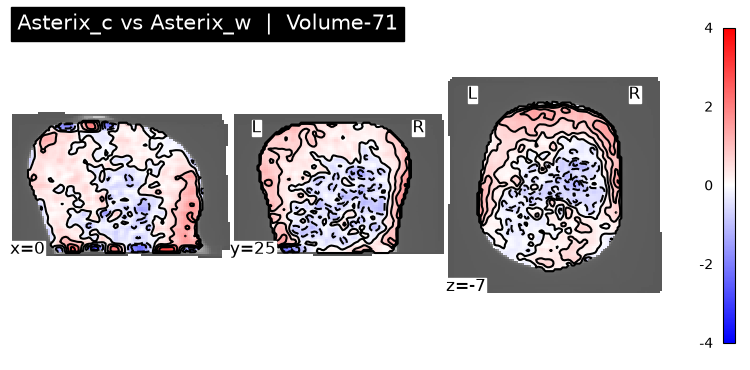

In [25]:
from nilearn.image import concat_imgs


results = []
results = np.zeros(( 72, *nib.load(TEMPLATE_PATH).get_fdata().shape))

for vol in range(0, 72):
    print(f"Processing volume {vol}")

    group_out_dir = os.path.join(PRJ_path, "Gradient_Analysis")

    condition01 = os.path.join(group_out_dir, f"01_eddy_corrected_2PANORAMIX2MNI6mm-vol{vol:04d}_group.nii.gz")
    condition02 = os.path.join(group_out_dir, f"13_eddy_corrected_2PANORAMIX2MNI6mm-vol{vol:04d}_group.nii.gz")

    n_c = nib.load(condition01).get_fdata().shape[3]
    n_w = nib.load(condition02).get_fdata().shape[3]
    print(f"  n_c={n_c}, n_w={n_w}")

    # one 4D image with n_c + n_w frames, Asterix_c volumes first then Asterix_w,
    # matching the row order of the design matrix below
    conditions = concat_imgs([condition01, condition02])

    # Unpaired (two-sample) design, sized to actual volume counts — not subject counts,
    # since each subject may contribute multiple volumes here
    unpaired_design_matrix = pd.DataFrame({
        "Asterix_c": [1] * n_c + [0] * n_w,
        "Asterix_w": [0] * n_c + [1] * n_w,
    })

    # ── GLM ───────────────────────────────────────────────────
    model = SecondLevelModel(n_jobs=2, verbose=0)
    model.fit(conditions, design_matrix=unpaired_design_matrix)

    z_map = model.compute_contrast("Asterix_c - Asterix_w", output_type="z_score")

    thresholded_map1, threshold1 = threshold_stats_img(
        z_map,
        alpha=0.001,
        cluster_threshold=10,
        two_sided=True,
    )

    display = plot_stat_map(
        z_map,
        bg_img=TEMPLATE_PATH,
        vmax=4,
        symmetric_cbar=True,
        cmap="bwr",
        colorbar=True,
        display_mode="ortho",
        black_bg=False,
        title=f"Asterix_c vs Asterix_w  |  Volume-{vol}",
    )
    
    display.add_contours(z_map, filled=False, colors="black")

    results[vol] = z_map.get_fdata()  # store thresholded values, not raw z-scores
    z_affine = nib.load(condition01).affine  # assumes all z-maps share the same affine; grab it once

[INFO] orientation = ('L', 'A', 'S')


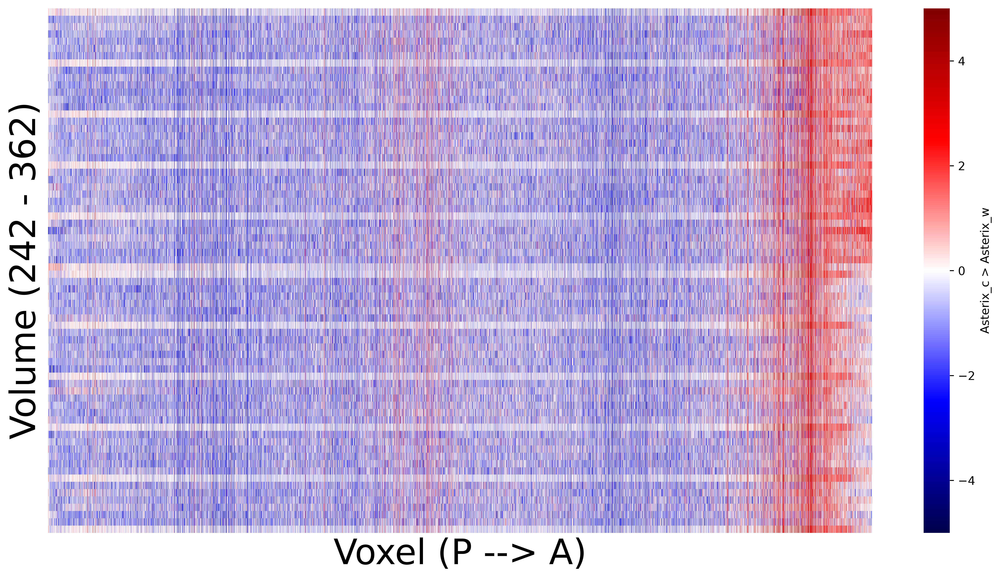

In [33]:
import os
import numpy as np
import nibabel as nib
from nibabel.affines import apply_affine
import matplotlib.pyplot as plt
import seaborn as sns

ZTHRESH = 2.5
VLIM = 5  # fixed color scale: blue at -5, white/grey at 0, red at +5
MIN_SIG_VOXELS = 15  # matches the threshold intent from the original script

out_dir = os.path.join(PRJ_path, "Gradients_Stability_Analysis")
plot_dir = os.path.join(PRJ_path, "unpaired_ttest_plots")
os.makedirs(plot_dir, exist_ok=True)

REMOVED = 0
rows = []
row_labels = []
shape = nib.load(TEMPLATE_PATH).get_fdata().shape
affine = z_affine

for volume in range(0,72):
    data = results[volume].copy()  # copy so thresholding here doesn't mutate the shared results array
   # data[(data > -ZTHRESH) & (data < ZTHRESH)] = 0  # keep only |z| beyond ZTHRESH, matching original logic
    row = np.ravel(data)

    if np.count_nonzero(row) < MIN_SIG_VOXELS:
        print(f"[INFO] vol{volume}: fewer than {MIN_SIG_VOXELS} significant voxels, skipping")
        REMOVED += 1
        continue

    rows.append(row)
    row_labels.append(f"vol{volume}")

if not rows:
    print("[WARN] no non-empty volumes, skipping plot")
else:
    axcodes = nib.aff2axcodes(affine)
    print(f"[INFO] orientation = {axcodes}")  # confirm A/P direction before trusting the sign below

    matrix = np.vstack(rows)

    sig_cols = np.any(np.abs(matrix) > ZTHRESH, axis=0)
    original_voxel_indices = np.where(sig_cols)[0]

    matrix = matrix[:, sig_cols]
    voxel_ijk = np.array(np.unravel_index(original_voxel_indices, shape)).T
    voxel_mni = apply_affine(affine, voxel_ijk)
    y_coords = voxel_mni[:, 1]  # anterior-posterior axis: negative = posterior, positive = anterior (if RAS+)

    sort_order = np.argsort(y_coords)  # ascending: most posterior first (left) -> most anterior last (right)
    matrix = matrix[:, sort_order]
    y_sorted = y_coords[sort_order]

    fig, ax = plt.subplots(figsize=(13, 7), dpi=600)

    sns.heatmap(
        matrix,
        cmap="seismic", center=0, vmin=-VLIM, vmax=VLIM,
        cbar=True, cbar_kws={"label": "Asterix_c > Asterix_w"},
        linecolor='black',
        xticklabels=False, yticklabels=False,
        ax=ax, robust=True, annot=False,
        square=False,
    )

    ax.set_title("", fontsize=30)
    ax.set_xlabel("Voxel (P --> A)", fontsize=30)
    ax.set_ylabel(f"Volume (242 - 362)", fontsize=30)

    plt.tight_layout()
    plt.savefig(os.path.join(plot_dir, "Asterix_heatmap_unpaired_ttest.png"), dpi = 600)
    plt.show()

In [34]:
import os
import numpy as np
import nibabel as nib
from nibabel.affines import apply_affine
import matplotlib.pyplot as plt
import seaborn as sns

ZTHRESH = 0
VLIM = 5  # fixed color scale: blue at -5, white/grey at 0, red at +5
MIN_SIG_VOXELS = 0  # matches the threshold intent from the original script

out_dir = os.path.join(PRJ_path, "Gradients_Stability_Analysis")
plot_dir = os.path.join(out_dir, "unpaired_ttest_plots")
os.makedirs(plot_dir, exist_ok=True)
derivatives = os.path.join(PRJ_path, "derivatives", "sub-36", "ses-01", "dwi")

BVECs = os.path.join(derivatives, "eddy", f"sub-36_ses-01_eddy_corrected.eddy_rotated_bvecs")
BVALs = os.path.join(derivatives, "prep", f"sub-36_ses-01_dir-PA-AP_part-mag_dwi.bval")

bvecs = np.loadtxt(BVECs)  # shape (3, N)
bvals = np.loadtxt(BVALs)  # shape (N,)

REMOVED = 0
rows = []
row_labels = []
kept_volume_indices = []  # tracks which volume indices survive filtering, so bvecs/bvals can be sliced the same way
shape = nib.load(TEMPLATE_PATH).get_fdata().shape
affine = z_affine

for volume in range(0, 72):
    data = results[volume].copy()  # copy so thresholding here doesn't mutate the shared results array
    #data[(data > -ZTHRESH) & (data < ZTHRESH)] = 0  # keep only |z| beyond ZTHRESH, matching original logic
    row = np.ravel(data)

    if np.count_nonzero(row) < MIN_SIG_VOXELS:
        print(f"[INFO] vol{volume}: fewer than {MIN_SIG_VOXELS} significant voxels, skipping")
        REMOVED += 1
        continue

    rows.append(row)
    row_labels.append(f"vol{volume}")
    kept_volume_indices.append(volume)

if not rows:
    print("[WARN] no non-empty volumes, skipping plot")
else:
    axcodes = nib.aff2axcodes(affine)
    print(f"[INFO] orientation = {axcodes}")  # confirm A/P direction before trusting the sign below

    matrix = np.vstack(rows)

    # Filter bvecs/bvals using the same volume indices kept in matrix's rows
    kept_volume_indices = np.array(kept_volume_indices)
    bvecs_filtered = bvecs[:, kept_volume_indices]  # shape (3, len(rows)) — same column order as matrix's rows
    bvals_filtered = bvals[kept_volume_indices]     # shape (len(rows),)

    print(f"[INFO] bvecs/bvals filtered: kept {len(kept_volume_indices)} / {N_volumes} volumes")

[INFO] orientation = ('L', 'A', 'S')
[INFO] bvecs/bvals filtered: kept 72 / 72 volumes


In [35]:
#Same amtrix 
out_dir = os.path.join(PRJ_path)

out_csv_path = os.path.join(out_dir, "zscore_per_volume_ESMRMb26_asterix")

matrix = np.asarray(matrix)
kept_volume_indices = np.asarray(kept_volume_indices)

np.savez_compressed(
    out_csv_path,
    matrix=matrix,
    volume=kept_volume_indices
)

print(f"\nSaved 4D matrix + volume indices to:")



Saved 4D matrix + volume indices to:


In [31]:
BVALs

'/home/malberti/wks14/temp/FF_DWI_Drift/derivatives/sub-36/ses-01/dwi/prep/sub-36_ses-01_dir-PA-AP_part-mag_dwi.bval'